# Vietnamese Handwritten Recognition with CRNN model

## Load Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
    # RIP Training time
    raise SystemError('GPU device not found')
    print('Found GPU at: {}'.format(device_name))

In [ ]:
TRAIN_DATA_ZIP_PATH = "/content/drive/MyDrive/reduced_img.zip"

In [ ]:
import zipfile
with zipfile.ZipFile(TRAIN_DATA_ZIP_PATH, 'r') as zip_ref:
    zip_ref.extractall("img")

In [ ]:
import os
# path to our directory images

# our train and test folder (not used for now but used later when we want to save images after processing)
DATA_PATH = "/content/img/reduced_img/train"
TEST_FOLDER = "/content/img/reduced_img/test"
TRAIN_FOLDER = "/content/img/reduced_img/train"

# our raw folders
RAW_FOLDER = '/content/img/reduced_img/train'

# label json files
TRAIN_JSON = "/content/img/reduced_img/train/train.json"

In [ ]:
RAW_FOLDER

'/content/img/reduced_img/train'

In [ ]:
TRAIN_JSON

'/content/img/reduced_img/train/train.json'

In [ ]:
import json
# open these label jsons files
with open(TRAIN_JSON, 'r', encoding='utf8') as f:
    train_labels = json.load(f)

Here are the labels for each image!

In [ ]:
train_labels

{'11401.jpg': 'các điếm-ốc này lấy cảm ứng từ truyền thống kiến trúc của người hoa eo biển và người châu âu',
 '17039.jpg': 'Cách tổ chức chính trị ở Việt Nam được sắp xếp theo trục dọc với Đảng Cộng sản giữ địa vị trên hết',
 '10643.jpg': '"Các Dân Tộc Phi Hán Sau Khi Làm Chủ Trung Nguyên Cũng Thường Tự Xem Bản Thân Là ""Trung Quốc"""',
 '17048.jpg': 'cách Tokyo chừng 1000 km về phía Nam',
 '11165.jpg': 'các địa điểm tôn giáo quan trọng khác tại israel là nazareth (linh thiêng trong cơ đốc giáo do là nơi lễ truyền tin của maria)',
 '2165.jpg': 'BƯỚC VÀO THẾ VẬN HỘI MÙA HÈ 1924',
 '13951.jpg': 'Các gói này có độ dài cố định',
 '11809.jpg': 'CÁC DOANH NGHIỆP SỬ DỤNG LAO ĐỘNG VÀ DOANH NGHIỆP MÔI GIỚI SẼ ĐỀN BÙ CHO GIA ĐÌNH NGƯỜI TỬ NẠN',
 '1524.jpg': 'bún ăn kèm với sườn non bung chuối hoặc ba ba om chuối',
 '12000.jpg': 'các đội đến từ tây ban nha hiện có 5 lần vô địch',
 '17989.jpg': 'CÁC KHU ĐỊNH CƯ NHỎ LÂN CẬN CÁC TRUNG TÂM ĐÔNG DÂN CƯ CHÍNH Ở THỔ NHĨ KỲ',
 '10038.jpg': 'Các daimyo m

In [ ]:
#find all characters in labels (so we don't blindly add chacters not even existed in our dataset)
char_list= set()
for label in train_labels.values():
    char_list.update(set(label))
char_list=sorted(char_list)
len(char_list)

221

So there are up to 140 unique characters in this Vietnamese dataset for addresses! Very interesting!

In [ ]:
# show all possible labels characters
"".join(char_list)

' !"%&\'()+,-./0123456789:;?ABCDEFGHIJKLMNOPQRSTUVWXYZ[]abcdefghijklmnopqrstuvwxyz°²ÀÁÂÃÈÉÊÌÍÒÓÔÕÖÙÚÝàáâãèéêìíòóôõöùúüýĂăĐđĨĩŌŨũƠơƯưẠạẢảẤấẦầẨẩẪẫẬậẮắẰằẳẵẶặẸẹẺẻẼẽẾếỀềỂểỄễỆệỈỉỊịỌọỎỏỐốỒồỔổỖỗỘộỚớỜờỞởỠỡỢợỤụỦủỨứỪừỬửỮữỰựỲỳỴỶỷỸỹ–—“”'

In [ ]:
# convert the words to array of indexs based on the char_list
def encode_to_labels(txt):
    # encoding each output word into digits of indexes
    dig_lst = []
    for index, char in enumerate(txt):
        try:
            dig_lst.append(char_list.index(char))
        except:
            print("No found in char_list :", char)

    return dig_lst

In [ ]:
encode_to_labels("Life is hard")

[37, 62, 59, 58, 0, 62, 72, 0, 61, 54, 71, 57]

In [ ]:
import pathlib
# find all image paths for train folder 1 and 2 and test folder
train_image_path = []

for item in pathlib.Path(RAW_FOLDER).glob('**/*'):
    if item.is_file() and item.suffix not in [".json"]:
        train_image_path.append(str(item))

In [ ]:
train_image_path[:10]

['/content/img/reduced_img/train/11523.jpg',
 '/content/img/reduced_img/train/12909.jpg',
 '/content/img/reduced_img/train/1882.jpg',
 '/content/img/reduced_img/train/17249.jpg',
 '/content/img/reduced_img/train/17571.jpg',
 '/content/img/reduced_img/train/15576.jpg',
 '/content/img/reduced_img/train/15425.jpg',
 '/content/img/reduced_img/train/18300.jpg',
 '/content/img/reduced_img/train/17070.jpg',
 '/content/img/reduced_img/train/16558.jpg']

## Preprocessing

#### Steps need to taken:
- Find all widths and heights of images
- Use openCV to read image
- Preprocess images (converting images to greyscale, bluring)
- Resize images so all images have the same size
- Split dataset into trainset and testset
- Build CRNN model with CTC loss
- Prediction
- Calculate metrics for SER, WER and CER

In [ ]:
dict_filepath_label={}
raw_data_path = pathlib.Path(os.path.join(RAW_FOLDER))
for item in raw_data_path.glob('**/*.*'):
    file_name=str(os.path.basename(item))
    if file_name != "train.json":
      label = train_labels[file_name]
      dict_filepath_label[str(item)]=label

In [ ]:
dict_filepath_label

{'/content/img/reduced_img/train/11523.jpg': 'Các điều kiện này thông thường lượng giá các dữ liệu đã được tính toán bởi chương trình và cho phép chương trình trở thành động hơn',
 '/content/img/reduced_img/train/12909.jpg': 'CÁC ĐÔ THỊ GIÁP RANH',
 '/content/img/reduced_img/train/1882.jpg': 'Bước đường giải phóng dân tộc còn nhiều chông gai hiểm trở',
 '/content/img/reduced_img/train/17249.jpg': 'cac huyen Thai Ninh',
 '/content/img/reduced_img/train/17571.jpg': 'các khách sạn lớn',
 '/content/img/reduced_img/train/15576.jpg': 'CÁCH NÀY GIÚP TÍNH ĐẠO HÀM CỦA BIỂU THỨC DỄ DÀNG',
 '/content/img/reduced_img/train/15425.jpg': 'Cach mang 1911 va 1921 va thoi ky Cong san',
 '/content/img/reduced_img/train/18300.jpg': 'Các Khu Vực Rừng Mưa Vùng Núi Nằm Ở Vùng Nội Địa Của Quốc Gia',
 '/content/img/reduced_img/train/17070.jpg': 'CÁCH TRÂN TRỌNG NHÂN TÀI CỦA NHÀ MẠC ĐƯỢC TÁC GIẢ NGUYỄN BÁ TRÁC THẾ KỶ 19',
 '/content/img/reduced_img/train/16558.jpg': 'Cách Phân Loại Khái Quát Nhất Về Cơ Sở Lý Lu

In [ ]:
# find maximum label length
label_lens= []
for label in dict_filepath_label.values():
    label_lens.append(len(label))
max_label_len = max(label_lens)

max_label_len

182

In [ ]:
all_image_paths = list(dict_filepath_label.keys())

In [ ]:
all_image_paths[:10]

['/content/img/reduced_img/train/11523.jpg',
 '/content/img/reduced_img/train/12909.jpg',
 '/content/img/reduced_img/train/1882.jpg',
 '/content/img/reduced_img/train/17249.jpg',
 '/content/img/reduced_img/train/17571.jpg',
 '/content/img/reduced_img/train/15576.jpg',
 '/content/img/reduced_img/train/15425.jpg',
 '/content/img/reduced_img/train/18300.jpg',
 '/content/img/reduced_img/train/17070.jpg',
 '/content/img/reduced_img/train/16558.jpg']

In [ ]:
import cv2
widths = []
heights = []
for image_path in all_image_paths:
    img = cv2.imread(image_path)
    (height, width, _) = img.shape
    heights.append(height)
    widths.append(width)

In [ ]:
min_height = min(heights)
max_height = max(heights)
min_width = min(widths)
max_width = max(widths)

In [ ]:
# padding and resizing info
(min_height, max_height, min_width, max_width)

(118, 118, 2167, 2167)

In [ ]:
from sklearn.model_selection import train_test_split
test_size = 0.2
train_image_paths, val_image_paths = train_test_split(all_image_paths, test_size=test_size, random_state=42)

In [ ]:
TIME_STEPS = 240

In [ ]:
import numpy as np

# lists for training dataset
training_img = []
training_txt = []
train_input_length = []
train_label_length = []
orig_txt = []
resize_max_width=0
i=0
for train_img_path in train_image_paths:

    img = cv2.cvtColor(cv2.imread(train_img_path), cv2.COLOR_BGR2GRAY)

    height, width = img.shape

    img = cv2.resize(img,(int(118/height*width),118))

    height, width = img.shape

    if img.shape[1] > resize_max_width:
        resize_max_width = img.shape[1]

    img = np.pad(img, ((0,0),(0, 2167-width)), 'median')

    # Blur it
    img = cv2.GaussianBlur(img, (5,5), 0)

    # Threshold the image using adapative threshold
    img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 4)

    # add channel dimension
    img = np.expand_dims(img , axis = 2)

    # Normalize each image
    img = img/255.

    label = dict_filepath_label[train_img_path]

    # split data into validation and training dataset as 10% and 90% respectively
    orig_txt.append(label)
    train_label_length.append(len(label))

    # our time steps for valid input
    train_input_length.append(TIME_STEPS)
    training_img.append(img)

    # convert words to digits based on charlist
    training_txt.append(encode_to_labels(label))
    i+=1
    if (i%500 == 0):
        print ("has processed trained {} files".format(i))
print(resize_max_width)

has processed trained 500 files
has processed trained 1000 files
2167


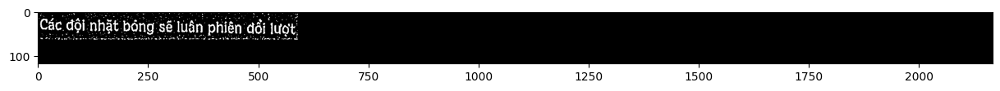

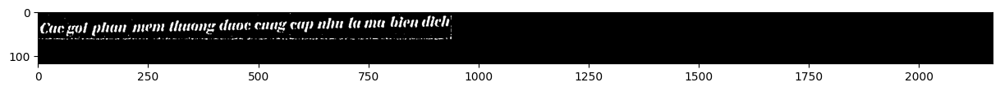

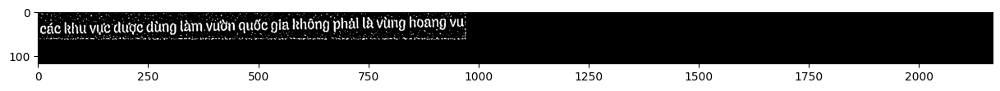

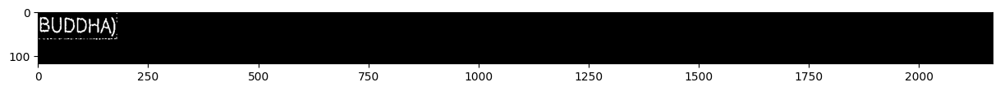

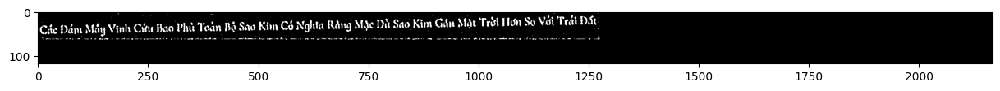

In [ ]:
import matplotlib.pyplot as plt
for i in range(5):
    plt.figure(figsize=(15,2))
    plt.imshow(training_img[i][:,:,0], cmap="gray")
    plt.show()

In [ ]:
#lists for validation dataset
valid_img = []
valid_txt = []
valid_input_length = []
valid_label_length = []
valid_orig_txt = []

i=0

for val_img_path in val_image_paths:
    # print(f_name)
    # read input image and convert into gray scale image
    img = cv2.cvtColor(cv2.imread(val_img_path), cv2.COLOR_BGR2GRAY)

    # in this dataset, we don't need to do any resize at all here.
    img = cv2.resize(img,(int(118/height*width),118))

    if img.shape[1] > resize_max_width:
        resize_max_width = img.shape[1]

    img = np.pad(img, ((0,0),(0, 2167-width)), 'median')

    # Blur
    img = cv2.GaussianBlur(img, (5,5), 0)

    # Threshold the image using adapative threshold
    img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 4)

    # add channel dimension
    img = np.expand_dims(img , axis = 2)

    # Normalize each image
    img = img/255.

    label = dict_filepath_label[val_img_path]

    valid_orig_txt.append(label)
    valid_label_length.append(len(label))

    # our time steps for valid input
    valid_input_length.append(TIME_STEPS)
    valid_img.append(img)

    # convert words to digits based on charlist
    valid_txt.append(encode_to_labels(label))
    i+=1
    if (i%500 == 0):
        print ("has processed test {} files".format(i))
print(resize_max_width)

2167


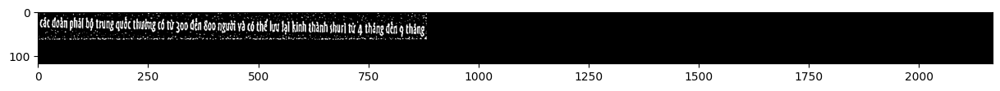

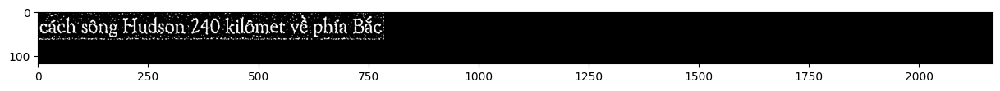

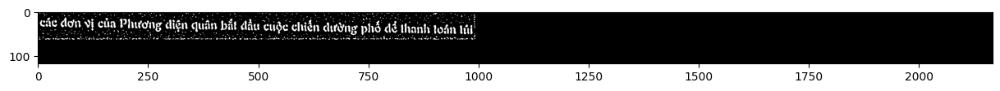

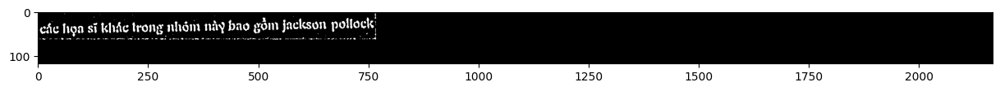

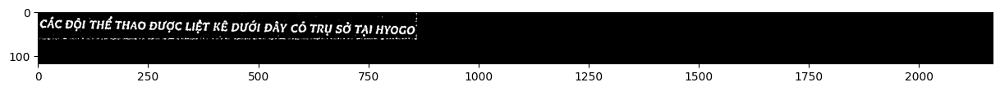

In [ ]:
import matplotlib.pyplot as plt
for i in range(5):
    plt.figure(figsize=(15,2))
    plt.imshow(valid_img[i][:,:,0], cmap="gray")
    plt.show()

In [ ]:
max_label_len = TIME_STEPS

In [ ]:
# import padding library
from tensorflow.keras.preprocessing.sequence import pad_sequences

# pad each output label to maximum text length
train_padded_txt = pad_sequences(training_txt, maxlen=max_label_len, padding='post', value = 0)
valid_padded_txt = pad_sequences(valid_txt, maxlen=max_label_len, padding='post', value = 0)

In [ ]:
train_padded_txt[0]

array([ 28, 100,  56,   0, 120, 185,  62,   0,  67,  61, 151,  73,   0,
        55, 109,  67,  60,   0,  72, 157,   0,  65,  74, 101,  67,   0,
        69,  61,  62, 105,  67,   0, 120, 181,  62,   0,  65, 129, 195,
        73,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   

## Model Building

In [ ]:
# import our model, different layers and activation function
from tensorflow.keras.layers import Dense, LSTM, Reshape, BatchNormalization, Input, Conv2D, MaxPool2D, Lambda, Bidirectional, Add, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.activations import relu, sigmoid, softmax
import tensorflow.keras.backend as K
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import CSVLogger, TensorBoard, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

In [ ]:
inputs = Input(shape=(118,2167,1))

# Block 1
x = Conv2D(64, (3,3), padding='same')(inputs)
x = MaxPool2D(pool_size=3, strides=3)(x)
x = Activation('relu')(x)
x_1 = x

# Block 2
x = Conv2D(128, (3,3), padding='same')(x)
x = MaxPool2D(pool_size=3, strides=3)(x)
x = Activation('relu')(x)
x_2 = x

# Block 3
x = Conv2D(256, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x_3 = x

# Block4
x = Conv2D(256, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Add()([x,x_3])
x = Activation('relu')(x)
x_4 = x

# Block5
x = Conv2D(512, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x_5 = x

# Block6
x = Conv2D(512, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = Add()([x,x_5])
x = Activation('relu')(x)

# Block7
x = Conv2D(1024, (3,3), padding='same')(x)
x = BatchNormalization()(x)
x = MaxPool2D(pool_size=(3, 1))(x)
x = Activation('relu')(x)

# pooling layer with kernel size (2,2) to make the height/2 #(1,9,512)
x = MaxPool2D(pool_size=(3, 1))(x)

# # to remove the first dimension of one: (1, 31, 512) to (31, 512)
squeezed = Lambda(lambda x: K.squeeze(x, 1))(x)

# # # bidirectional LSTM layers with units=128
blstm_1 = Bidirectional(LSTM(512, return_sequences=True, dropout = 0.2))(squeezed)
blstm_2 = Bidirectional(LSTM(512, return_sequences=True, dropout = 0.2))(blstm_1)

# # this is our softmax character proprobility with timesteps
outputs = Dense(len(char_list)+1, activation = 'softmax')(blstm_2)

# model to be used at test time

act_model = Model(inputs, outputs)

In [ ]:
act_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 118, 2167, 1)]       0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 118, 2167, 64)        640       ['input_1[0][0]']             
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 39, 722, 64)          0         ['conv2d[0][0]']              
 D)                                                                                               
                                                                                                  
 activation (Activation)     (None, 39, 722, 64)          0         ['max_pooling2d[0][0]']   

In [ ]:
### ctc definition part
"""
The reason why we use ctc_batch_cost instead of ctc_cost because
In batch cost, the program managed to mask out padded sequence using label_length,
So the cost won't include the padding 0 section.
"""

"""
The way CTC is modelled currently in Keras is that you need to implement the loss function as a layer, you did that already (loss_out).
Your problem is that the inputs you give that layer are not tensors from Theano/TensorFlow but numpy arrays.
To change that one option is to model these values as inputs to your model.
That is why we need to manually create Input for labels, input length and label_length.
"""

# define the label input shape for ctc
labels = Input(name='the_labels', shape=[max_label_len], dtype='float32')

"""
where input_length and label_length are constants you created previously
the easiest way here is to have a fixed batch size in training
the lengths should have the same batch size (see shapes in the link for ctc_cost)
"""

# define the length of input and label for ctc
input_length = Input(name='input_length', shape=[1], dtype='int64')
label_length = Input(name='label_length', shape=[1], dtype='int64')

# define a ctc lambda function to take arguments and return ctc_bach_cost
def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args
    """
    labels: tensor (number of samples, max_string_length) containing the truth labels.
    y_pred: tensor (number of samples, time_steps, num_character_labels) containing the prediction, or output of the softmax.
    input_length: tensor (number of samples, 1) containing the sequence length for each batch item in y_pred.
    label_length: tensor (number of samples, 1) containing the sequence length for each batch item in y_true.
    """
    return K.ctc_batch_cost(labels, y_pred, input_length, label_length)

# out loss function (just take the inputs and put it in our ctc_batch_cost)
loss_out = Lambda(ctc_lambda_func, output_shape=(1,), name='ctc')([outputs, labels, input_length, label_length])

#model to be used at training time
model = Model(inputs=[inputs, labels, input_length, label_length], outputs=loss_out)

In [ ]:
# ready ctc loss function and optimizers
model.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer = 'adam')

# our callbacks hell to optimize our learning
callbacks = [
    TensorBoard(
        log_dir='./logs',
        histogram_freq=10,
        profile_batch=0,
        write_graph=True,
        write_images=False,
        update_freq="epoch"),
    ModelCheckpoint(
        filepath=os.path.join('checkpoint_weights.hdf5'),
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=True,
        verbose=1),
    EarlyStopping(
        monitor='val_loss',
        min_delta=1e-8,
        patience=20,
        restore_best_weights=True,
        verbose=1),
    ReduceLROnPlateau(
        monitor='val_loss',
        min_delta=1e-8,
        factor=0.2,
        patience=10,
        verbose=1)
]
callbacks_list = callbacks

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 118, 2167, 1)]       0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 118, 2167, 64)        640       ['input_1[0][0]']             
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 39, 722, 64)          0         ['conv2d[0][0]']              
 D)                                                                                               
                                                                                                  
 activation (Activation)     (None, 39, 722, 64)          0         ['max_pooling2d[0][0]'] 

In [ ]:
# notice I convert everything to numpy array here since model can fit either tensors and numpy array
# the reason why i stick with numpy array because it is simple to code and also because it is baseline solution
# I want to use openCV (can't run with tensors because it is CPU operations)
# And if I want to use tensors then i will make sure my image preprocessing functions uses tensor compatible operations

# ready our training data
training_img = np.array(training_img)
train_input_length = np.array(train_input_length)  # all must be equal length to T timesteps
train_label_length = np.array(train_label_length)  # different length (only the same in Captcha dataset)

# ready our validating data
valid_img = np.array(valid_img)
valid_input_length = np.array(valid_input_length) # all must be equal length to T timesteps
valid_label_length = np.array(valid_label_length) # different length (only the same in Captcha dataset)



In [ ]:
from keras.models import load_model

#model.load_weights("/content/drive/MyDrive/model_15.weights.h5")

# choose batchsize and epochs

batch_size = 32
epochs = 100

history = model.fit(x=[training_img, train_padded_txt, train_input_length, train_label_length],
          y=np.zeros(len(training_img)),
          batch_size=batch_size,
          epochs = epochs,
          validation_data = ([valid_img, valid_padded_txt, valid_input_length, valid_label_length], [np.zeros(len(valid_img))]),
          verbose = 1, callbacks = callbacks_list)

Epoch 1/100
36/36 [==============================] - ETA: 0s - loss: 283.5363
Epoch 1: val_loss improved from inf to 231.73267, saving model to checkpoint_weights.hdf5
36/36 [==============================] - 155s 3s/step - loss: 283.5363 - val_loss: 231.7327 - lr: 0.0010
Epoch 2/100
36/36 [==============================] - ETA: 0s - loss: 233.1263
Epoch 2: val_loss did not improve from 231.73267
36/36 [==============================] - 45s 1s/step - loss: 233.1263 - val_loss: 234.8512 - lr: 0.0010
Epoch 3/100
36/36 [==============================] - ETA: 0s - loss: 217.6380
Epoch 3: val_loss improved from 231.73267 to 216.69109, saving model to checkpoint_weights.hdf5
36/36 [==============================] - 44s 1s/step - loss: 217.6380 - val_loss: 216.6911 - lr: 0.0010
Epoch 4/100
36/36 [==============================] - ETA: 0s - loss: 213.2875
Epoch 4: val_loss did not improve from 216.69109
36/36 [==============================] - 44s 1s/step - loss: 213.2875 - val_loss: 217.4095 

In [ ]:
model.save_weights('model_40(221).weights.h5')

## Evaluation

In [ ]:
# load the saved best model weights
act_model.load_weights(os.path.join('/content/drive/MyDrive/model_40(221).weights.h5'))

In [ ]:
# predict outputs on validation images
NO_PREDICTS = 100
OFFSET=0
# prediction = act_model.predict(valid_img[OFFSET:OFFSET+NO_PREDICTS])
prediction = act_model.predict(valid_img)

9/9 [==============================] - 3s 344ms/step


In [ ]:
# NO_PREDICTS image results
# 9 timesteps
# 32 chars + 1 blank
prediction.shape

(287, 240, 222)

In [ ]:
# use CTC decoder
out = K.get_value(K.ctc_decode(prediction, input_length=np.ones(prediction.shape[0])*prediction.shape[1],
                         greedy=True)[0][0])
# see the results
all_predictions =[]
i = 0
for x in out:
    print("original_text  = ", valid_orig_txt[i+OFFSET])
    print("predicted text = ", end = '')
    pred = ""
    for p in x:
        if int(p) != -1:
            pred += char_list[int(p)]
    print(pred)
    all_predictions.append(pred)
    i+=1

original_text  =  các đoàn phái bộ trung quốc thường có từ 300 đến 800 người và có thể lưu lại kinh thành shuri từ 4 tháng đến 9 tháng
predicted text = ác ả ph tun ưn i o ế ào u (h nh i nh ành h ù àng ùng thág
original_text  =  cách sông Hudson 240 kilômet về phía Bắc
predicted text = cách sông Hudson 240 kilômet về phía Bắc
original_text  =  các đơn vị của Phương diện quân bắt đầu cuộc chiến đường phố để thanh toán túi
predicted text = các đơn vị của Phương diện quân bắt đầu cuộc chiến đường phố để thanh toán túi
original_text  =  các họa sĩ khác trong nhóm này bao gồm jackson pollock
predicted text = các họa sĩ khác trong nhóm này bao gồm jackson polock
original_text  =  CÁC ĐỘI THỂ THAO ĐƯỢC LIỆT KÊ DƯỚI ĐÂY CÓ TRỤ SỞ TẠI HYOGO
predicted text = CÁC ĐỘI THỂ THAO ĐƯỢC LIỆT KÊ DƯỚI ĐÂY CÓ TRỤ SỞ TẠI HYOGO
original_text  =  "Các khu bảo tồn rừng là bộ phận của 20 triệu ha rừng rừng mưa xích đạo được phân định theo sáng kiến ""Heart of Borneo"""
predicted text = "Các khu bảo tồn rừng là 

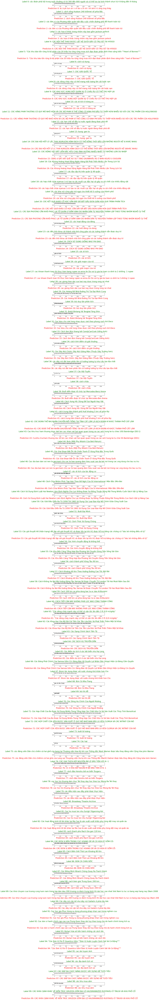

In [ ]:
#YOUR PART: WRITE TO PRINT OUT THE IMAGES IN NICE 2D ARRAY PLOT WITH ORIGINAL TEXT AND PREDICTED TEXT
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.figure(figsize=(10,200))
col=0
row=1
gs1 = gridspec.GridSpec(NO_PREDICTS, 1)
# gs1.update(wspace=0.025, hspace=0.025)
for n in range(NO_PREDICTS):
    plt.subplot(gs1[n])
    plt.imshow(valid_img[n][:,:,0], cmap="gray_r")
    plt.title(f"Label {n}: "+valid_orig_txt[n+OFFSET], fontsize=20, color="green")
    plt.xlabel(f"Prediction {n}: "+all_predictions[n+OFFSET], fontsize=20, color="red")


In [ ]:
import string
import unicodedata
import editdistance


def ocr_metrics(predicts, ground_truth, norm_accentuation=False, norm_punctuation=False):
    """Calculate Character Error Rate (CER), Word Error Rate (WER) and Sequence Error Rate (SER)"""

    if len(predicts) == 0 or len(ground_truth) == 0:
        return (1, 1, 1)

    cer, wer, ser = [], [], []

    for (pd, gt) in zip(predicts, ground_truth):

        if norm_accentuation:
            pd = unicodedata.normalize("NFKD", pd).encode("ASCII", "ignore").decode("ASCII")
            gt = unicodedata.normalize("NFKD", gt).encode("ASCII", "ignore").decode("ASCII")

        if norm_punctuation:
            pd = pd.translate(str.maketrans("", "", string.punctuation))
            gt = gt.translate(str.maketrans("", "", string.punctuation))

        pd_cer, gt_cer = list(pd.lower()), list(gt.lower())
        dist = editdistance.eval(pd_cer, gt_cer)
        cer.append(dist / (max(len(pd_cer), len(gt_cer))))

        pd_wer, gt_wer = pd.lower().split(), gt.lower().split()
        dist = editdistance.eval(pd_wer, gt_wer)
        wer.append(dist / (max(len(pd_wer), len(gt_wer))))

        pd_ser, gt_ser = [pd], [gt]
        dist = editdistance.eval(pd_ser, gt_ser)
        ser.append(dist / (max(len(pd_ser), len(gt_ser))))

    cer_f = sum(cer) / len(cer)
    wer_f = sum(wer) / len(wer)
    ser_f = sum(ser) / len(ser)

    return (cer_f, wer_f, ser_f)

In [ ]:
evaluate = ocr_metrics(predicts=all_predictions,
                                  ground_truth=valid_orig_txt,
                                  norm_accentuation=False,
                                  norm_punctuation=False)

e_corpus = "\n".join([
    "Metrics:",
    "Character Error Rate: {}".format(evaluate[0]),
    "Word Error Rate:      {}".format(evaluate[1]),
    "Sequence Error Rate:  {}".format(evaluate[2]),
])

In [ ]:
print(e_corpus)

Metrics:
Character Error Rate: 0.026372138060417726
Word Error Rate:      0.08034691516562273
Sequence Error Rate:  0.2857142857142857


## Tensorboard

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>